# Learning Functions Part 2

In this notebook we'll learn simple functions over sequences of numbers.

In [1]:
# Load environment
using Pkg
Pkg.activate("..")

"/Users/domluna/github/NeuralArithmetic/Project.toml"

In [2]:
using NeuralArithmetic
using Flux
using Plots
using DataFrames

┌ Info: Precompiling NeuralArithmetic [77cec1ae-a0aa-11e8-15c8-b1760286d022]
└ @ Base loading.jl:1186


┌ Info: Recompiling stale cache file /Users/domluna/.julia/compiled/v1.0/DataFrames/AR9oZ.ji for DataFrames [a93c6f00-e57d-5684-b7b6-d8193f3e46c0]
└ @ Base loading.jl:1184


loaded


In [3]:
# number of training set examples
N = 500

500

The dataset of a function will contain `N` training examples, 50 validation examples (interpolation), and 50 testing examples (extrapolation).

In [4]:
# N sequences of length 1 to 10
train_seqs = rand.(rand(10:10, N)) 
# (interpolation)
val_seqs = rand.(rand(10:10, 50))
# (extrapolation) sequences longer than shown
test_seqs = rand.(rand(1000:1000, 50))

50-element Array{Array{Float64,1},1}:
 [0.0848034, 0.997459, 0.951482, 0.972191, 0.68016, 0.14464, 0.473981, 0.591404, 0.0670445, 0.0305006  …  0.580626, 0.810542, 0.926578, 0.892905, 0.841506, 0.0584397, 0.108462, 0.246216, 0.168052, 0.355895] 
 [0.0271665, 0.916315, 0.239095, 0.923426, 0.54407, 0.906861, 0.142751, 0.318106, 0.0156875, 0.352596  …  0.369968, 0.397568, 0.135016, 0.165233, 0.564543, 0.899543, 0.932253, 0.0826452, 0.796633, 0.0780321]
 [0.931287, 0.150606, 0.577403, 0.156952, 0.566363, 0.587038, 0.543316, 0.797598, 0.296399, 0.786663  …  0.339901, 0.258264, 0.745328, 0.332831, 0.118402, 0.829211, 0.300637, 0.740176, 0.754104, 0.927363]   
 [0.901344, 0.106925, 0.283461, 0.676624, 0.042067, 0.589052, 0.810087, 0.902334, 0.441852, 0.670861  …  0.774285, 0.624382, 0.279911, 0.474923, 0.775994, 0.461229, 0.859603, 0.617108, 0.887076, 0.159357]   
 [0.228089, 0.923846, 0.359484, 0.935597, 0.441322, 0.154943, 0.814853, 0.674503, 0.186605, 0.519225  …  0.197008, 0.842087, 0.883

In [7]:
function f(m, x)
    state = m[1].(x)[end]
    # reset hidden state of recurrent node on each sequence
    Flux.reset!(m[1])
    m[2:end](state)
end

loss(m) = (x, y) -> Flux.mse(f(m, x), y)

function train_model(lossf, opt, data, epochs::Int, print_interval::Int)
    hist = zeros(epochs)
    for i in 1:epochs
        Flux.train!(lossf, data, opt)
        train_loss = Flux.data(sum(lossf(d...) for d in data[1:50]))
        if print_interval != -1 && i % print_interval == 0
            @info "Iteration $i, training loss = $train_loss"
        end
        hist[i] = train_loss
    end
    return hist
end

train_model (generic function with 1 method)

Let's run the experiments and plot results.

In [8]:
epochs = 500
print_interval = 50

50

### `+` Data

In [9]:
add_data_train = [(s, reduce(+, s)) for s in train_seqs]
add_data_val = [(s, reduce(+, s)) for s in val_seqs]
add_data_test = [(s, reduce(+, s)) for s in test_seqs];

┌ Info: Iteration 50, training loss = 0.00045744326619010856
└ @ Main In[7]:16
┌ Info: Iteration 100, training loss = 0.00018261055808740803
└ @ Main In[7]:16
┌ Info: Iteration 150, training loss = 8.442169758876747e-5
└ @ Main In[7]:16
┌ Info: Iteration 200, training loss = 4.703356501592839e-5
└ @ Main In[7]:16
┌ Info: Iteration 250, training loss = 3.337970882851199e-5
└ @ Main In[7]:16
┌ Info: Iteration 300, training loss = 2.822230543733319e-5
└ @ Main In[7]:16
┌ Info: Iteration 350, training loss = 2.5737601791339896e-5
└ @ Main In[7]:16
┌ Info: Iteration 400, training loss = 2.4081876775001687e-5
└ @ Main In[7]:16
┌ Info: Iteration 450, training loss = 2.2720689206927456e-5
└ @ Main In[7]:16
┌ Info: Iteration 500, training loss = 2.1499387246469997e-5
└ @ Main In[7]:16
┌ Info: ("Validation loss", 9.920826841551052e-5)
└ @ Main In[10]:5
┌ Info: ("Test loss", 24595.268103948998)
└ @ Main In[10]:6


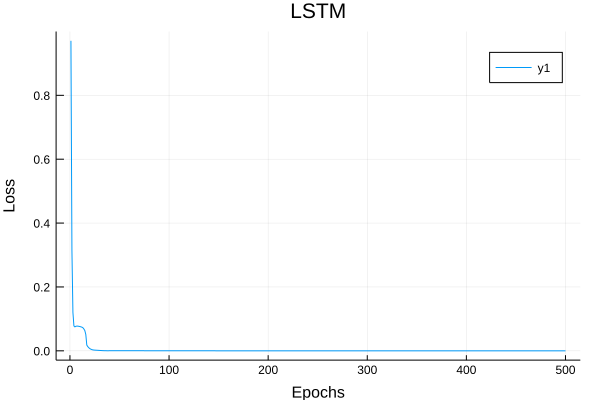

In [10]:
m = Chain(LSTM(1, 2), Dense(2, 1))
opt = ADAM(params(m))
lf = loss(m)
hist = train_model(lf, opt, add_data_train, epochs, print_interval)
@info "Validation loss", sum(lf(d...) for d in add_data_val) |> Flux.data
@info "Test loss", sum(lf(d...) for d in add_data_test) |> Flux.data
plot(hist, title="LSTM", xlabel="Epochs", ylabel="Loss")

┌ Info: Iteration 50, training loss = 0.004170318194582708
└ @ Main In[7]:16
┌ Info: Iteration 100, training loss = 0.0004669062143554596
└ @ Main In[7]:16
┌ Info: Iteration 150, training loss = 0.0003033443783278752
└ @ Main In[7]:16
┌ Info: Iteration 200, training loss = 0.0002813595297024085
└ @ Main In[7]:16
┌ Info: Iteration 250, training loss = 0.0002629250887373916
└ @ Main In[7]:16
┌ Info: Iteration 300, training loss = 0.000248169203524939
└ @ Main In[7]:16
┌ Info: Iteration 350, training loss = 0.00023613868771962674
└ @ Main In[7]:16
┌ Info: Iteration 400, training loss = 0.00022598137751966916
└ @ Main In[7]:16
┌ Info: Iteration 450, training loss = 0.00021742654993417416
└ @ Main In[7]:16
┌ Info: Iteration 500, training loss = 0.0002105025327742916
└ @ Main In[7]:16
┌ Info: ("Validation loss", 2.082089542016668e-5)
└ @ Main In[11]:5
┌ Info: ("Test loss", 494.0295787403053)
└ @ Main In[11]:6


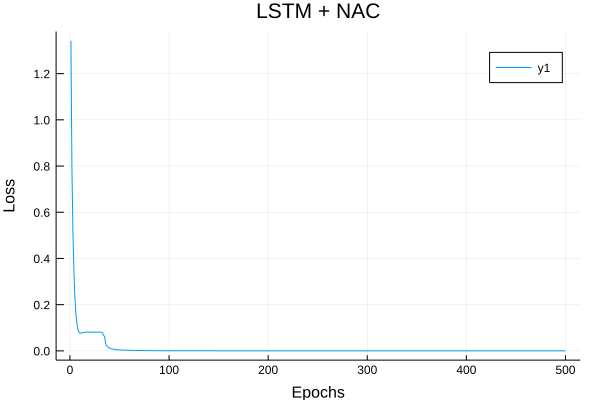

In [11]:
m = Chain(LSTM(1, 2), NAC(2, 1))
opt = ADAM(params(m))
lf = loss(m)
hist = train_model(lf, opt, add_data_train, epochs, print_interval)
@info "Validation loss", Flux.data(sum(lf(d...) for d in add_data_val) / length(add_data_val))
@info "Test loss", Flux.data(sum(lf(d...) for d in add_data_test) / length(add_data_test))
plot(hist, title="LSTM + NAC", xlabel="Epochs", ylabel="Loss")

### `*` Data

In [11]:
mul_data_train = [(s, reduce(*, s)) for s in train_seqs]
mul_data_val = [(s, reduce(*, s)) for s in val_seqs]
mul_data_test = [(s, reduce(*, s)) for s in test_seqs];

### `sqrt` Data

In [12]:
sqrt_data_train = [(s, sum(sqrt.(abs.(s)))) for s in train_seqs]
sqrt_data_val = [(s, sum(sqrt.(abs.(s)))) for s in val_seqs]
sqrt_data_test = [(s, sum(sqrt.(abs.(s)))) for s in test_seqs];